In [146]:
# @title
from IPython.display import HTML

HTML("""
<div style="
    display: flex;
    justify-content: space-between;
    align-items: center;
    padding: 10px 0;
">

    <div style="flex: 1; text-align: left;">
        <h1 style="
            font-size: 34px;
            color: green;
            margin: 0;
            font-weight: 700;
        ">
            Customer Segmentation using Machine Learning
        </h1>

        <p style="
            font-size: 18px;
            color: #566573;       /* Soft gray */
            margin-top: 8px;
        ">
            RFM Analysis • K-Means • Hierarchical Clustering
        </p>
    </div>

</div>
""")


In [145]:
# @title
from IPython.display import display, HTML

display(HTML('''
<center>
  <img src="https://media.geeksforgeeks.org/wp-content/uploads/20240510120119/cluster-analysis.png"
       alt="Customer Segmentation"
       width="850">
</center>
'''))


## 👤 Customer Information
| Column Name      | Description |
|------------------|-------------|
| ID               | Unique identifier for each customer |
| Year_Birth       | Year the customer was born |
| Education        | Customer’s level of education (Graduation, Master, PhD, etc.) |
| Marital_Status   | Customer’s marital status |
| Income           | Annual household income |

---

## 👨‍👩‍👧‍👦 Household Information
| Column Name | Description |
|-------------|-------------|
| Kidhome     | Number of children living in the household |
| Teenhome    | Number of teenagers living in the household |

---

## 📅 Customer Timeline
| Column Name   | Description |
|---------------|-------------|
| Dt_Customer   | Date when the customer joined the company |
| Recency       | Number of days since the last purchase |

---

## 🛍️ Product Spending (Last 2 Years)
| Column Name        | Description |
|--------------------|-------------|
| MntWines           | Amount spent on wine products |
| MntFruits          | Amount spent on fruit products |
| MntMeatProducts    | Amount spent on meat products |
| MntFishProducts    | Amount spent on fish products |
| MntSweetProducts   | Amount spent on sweet products |
| MntGoldProds       | Amount spent on gold products |

---

## 🧾 Purchase Behavior
| Column Name            | Description |
|------------------------|-------------|
| NumDealsPurchases      | Number of purchases made using discounts |
| NumWebPurchases        | Number of purchases made through the website |
| NumCatalogPurchases   | Number of purchases made using catalogs |
| NumStorePurchases     | Number of purchases made directly in stores |
| NumWebVisitsMonth     | Number of visits to the website per month |

---

## 📢 Marketing Campaigns
| Column Name      | Description |
|------------------|-------------|
| AcceptedCmp1    | Accepted campaign 1 (1 = Yes, 0 = No) |
| AcceptedCmp2    | Accepted campaign 2 (1 = Yes, 0 = No) |
| AcceptedCmp3    | Accepted campaign 3 (1 = Yes, 0 = No) |
| AcceptedCmp4    | Accepted campaign 4 (1 = Yes, 0 = No) |
| AcceptedCmp5    | Accepted campaign 5 (1 = Yes, 0 = No) |

---

## 😠 Complaints
| Column Name | Description |
|-------------|-------------|
| Complain    | Customer complained in the last 2 years (1 = Yes, 0 = No) |

---

## ⚙️ Constant Columns
| Column Name      | Description |
|------------------|-------------|
| Z_CostContact    | Fixed cost of contacting a customer |
| Z_Revenue        | Fixed revenue value |

---

## 🎯 Target Variable
| Column Name | Description |
|-------------|-------------|
| Response    | Customer accepted the last marketing campaign (1 = Yes, 0 = No) |


In [98]:
#!pip install ydata_profiling

In [99]:
from ydata_profiling import ProfileReport
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

df = pd.read_csv('/content/marketing_campaign.csv', sep='\t')
profile=ProfileReport(df,title='Profiling Report')
profile.to_file(output_file='output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:00<00:00, 31.36it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [100]:
profile

##🧭 **Data Overview**

In [101]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [103]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [105]:
df.shape

(2240, 29)

In [106]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [107]:
df.describe(include='O')

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,31-08-2012
freq,1127,864,12


In [108]:
df.duplicated().sum()

np.int64(0)

In [109]:
# ---- Show all columns & rows without truncation ----
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# ---- Calculate missing values ----
missing_values = df.isnull().sum()

# ---- Calculate percentage of missing values ----
total_rows = df.shape[0]
missing_percentage = (missing_values / total_rows) * 100

# ---- Create a new DataFrame with missing values and percentage ----
missing_df = pd.DataFrame({'Missing Values': missing_values, 'Percentage %': missing_percentage})
missing_df

,Missing Values,Percentage %
ID,0,0.000000
Year_Birth,0,0.000000
Education,0,0.000000
Marital_Status,0,0.000000
Income,24,1.071429
Kidhome,0,0.000000
Teenhome,0,0.000000
Dt_Customer,0,0.000000
Recency,0,0.000000
MntWines,0,0.000000


## 🧹 **Data Cleaning**

In [110]:
drop_cols = ['ID', 'Z_CostContact', 'Z_Revenue', 'Response']
df = df.drop(columns=drop_cols)

In [111]:
df.shape

(2240, 25)

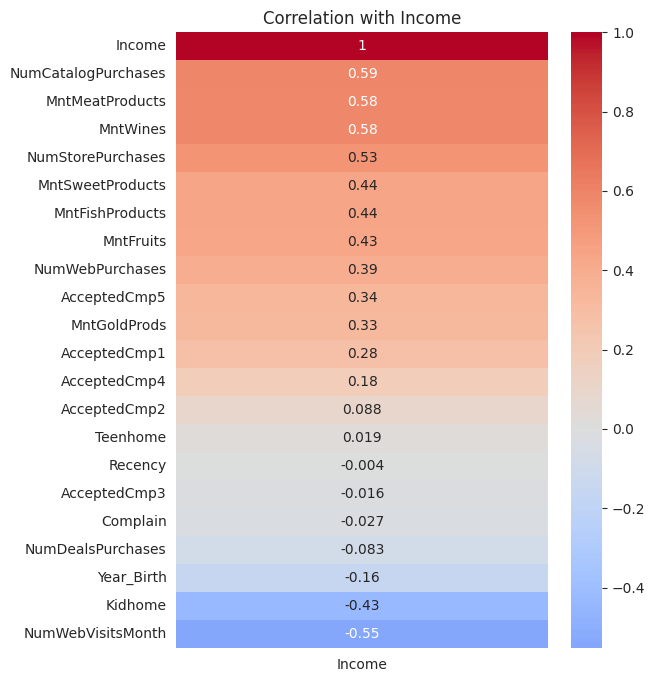

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt

# كل الأعمدة الرقمية
num_cols = df.select_dtypes(include='number')

# نحسب correlation مع Income فقط
income_corr = num_cols.corr()[['Income']].sort_values(by='Income', ascending=False)

# رسم heatmap
plt.figure(figsize=(6,8))
sns.heatmap(income_corr, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation with Income')
plt.show()

In [113]:
from sklearn.impute import KNNImputer

# حساب correlation مع Income
num_cols = df.select_dtypes(include='number')
income_corr = num_cols.corr()[['Income']]

# اختيار الأعمدة التي لها correlation مطلقة أعلى من 0.3 مع Income
threshold = 0.3
important_cols = income_corr[ income_corr['Income'].abs() > threshold ].index.tolist()

# نضيف Income للتعويض
cols_for_knn = important_cols.copy()
if 'Income' not in cols_for_knn:
    cols_for_knn.append('Income')

# تطبيق KNN Imputer
imputer = KNNImputer(n_neighbors=5)
df[cols_for_knn] = imputer.fit_transform(df[cols_for_knn])

In [114]:
df.isnull().sum().sum()

np.int64(0)

###Data Type Conversion

In [115]:
df.dtypes

,0
Year_Birth,int64
Education,object
Marital_Status,object
Income,float64
Kidhome,float64
Teenhome,int64
Dt_Customer,object
Recency,int64
MntWines,float64
MntFruits,float64


In [116]:
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], dayfirst=True)

df['Education'] = df['Education'].astype('category')
df['Marital_Status'] = df['Marital_Status'].astype('category')

float_to_int_cols = ['Kidhome', 'Teenhome', 'NumWebPurchases', 'NumCatalogPurchases',
                     'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp5']

for col in float_to_int_cols:
    df[col] = df[col].astype(int)

In [117]:
df.duplicated().sum()

np.int64(201)

In [118]:
df.drop_duplicates(inplace=True)

In [119]:
df.shape

(2039, 25)

###Outliers Detection

In [120]:
num_cols = df.select_dtypes(include='number').columns

outliers_iqr = {}

for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR

    outliers = df[(df[col] < lower) | (df[col] > upper)][col]
    outliers_iqr[col] = outliers

# نعرض عدد الـ outliers في كل عمود
for col, out in outliers_iqr.items():
    print(f"{col}: {len(out)} outliers")

Year_Birth: 3 outliers
Income: 8 outliers
Kidhome: 0 outliers
Teenhome: 0 outliers
Recency: 0 outliers
MntWines: 33 outliers
MntFruits: 223 outliers
MntMeatProducts: 171 outliers
MntFishProducts: 202 outliers
MntSweetProducts: 219 outliers
MntGoldProds: 184 outliers
NumDealsPurchases: 77 outliers
NumWebPurchases: 4 outliers
NumCatalogPurchases: 22 outliers
NumStorePurchases: 0 outliers
NumWebVisitsMonth: 8 outliers
AcceptedCmp3: 148 outliers
AcceptedCmp4: 155 outliers
AcceptedCmp5: 147 outliers
AcceptedCmp1: 134 outliers
AcceptedCmp2: 26 outliers
Complain: 20 outliers


In [121]:
import pandas as pd
import numpy as np

# الأعمدة اللي هتدخل في حساب RFM
cols_to_handle = ['Recency','NumDealsPurchases','NumWebPurchases',
                  'NumCatalogPurchases','NumStorePurchases',
                  'MntWines','MntFruits','MntMeatProducts',
                  'MntFishProducts','MntSweetProducts','MntGoldProds']

for col in cols_to_handle:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5*IQR
    upper = Q3 + 1.5*IQR
    df[col] = df[col].clip(lower, upper)

print("Outliers handled for columns affecting RFM.")

Outliers handled for columns affecting RFM.


##📊 **Visualization**

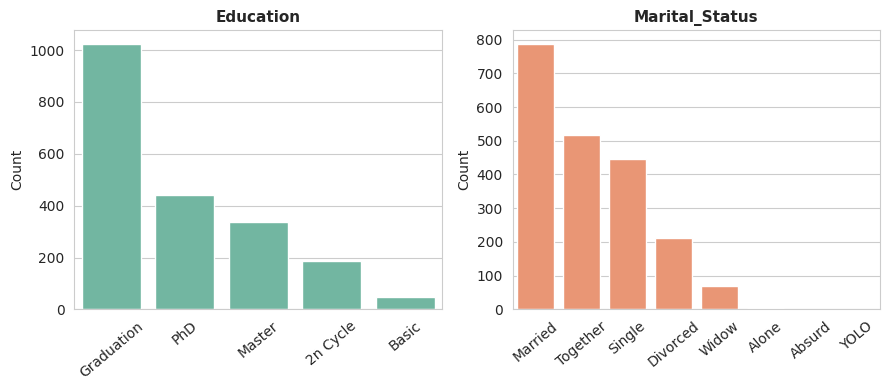

In [122]:
import seaborn as sns
import matplotlib.pyplot as plt

cat_cols = df.select_dtypes(include=['object','category']).columns

sns.set_style("whitegrid")
colors = sns.color_palette("Set2", len(cat_cols))  # لون مختلف لكل plot

plt.figure(figsize=(9,4))

for i, (col, color) in enumerate(zip(cat_cols, colors), 1):
    plt.subplot(1, len(cat_cols), i)

    order = df[col].value_counts().index

    sns.countplot(
        x=df[col],
        order=order,
        color=color   # لون واحد فقط
    )

    plt.title(col, fontsize=11, fontweight='bold')
    plt.xticks(rotation=40)
    plt.xlabel("")
    plt.ylabel("Count")

plt.tight_layout()
plt.show()

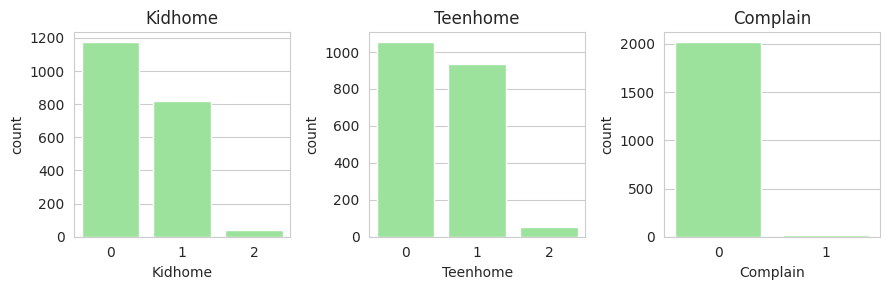

In [123]:
cat_cols = ['Kidhome', 'Teenhome', 'Complain']
color = 'lightgreen'  # لون واحد لكل plot

plt.figure(figsize=(9,3))  # أوسع لأننا 3 أعمدة
for i, col in enumerate(cat_cols, 1):
    plt.subplot(1, len(cat_cols), i)

    # ترتيب الفئات حسب عددها (الأكثر تكرارًا أولًا)
    order = df[col].value_counts().sort_values(ascending=False).index

    sns.countplot(x=df[col], order=order, color=color)
    plt.title(col)
    plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

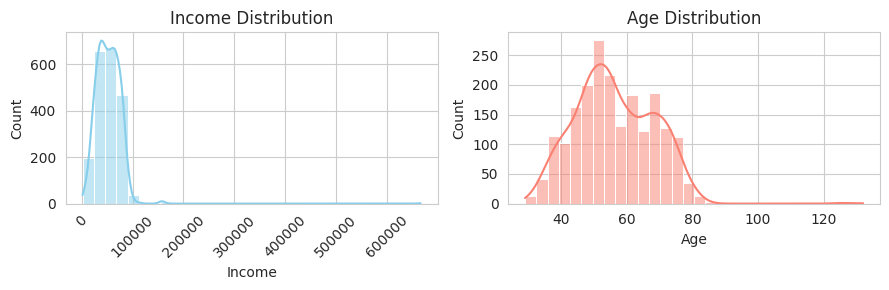

In [124]:
plt.figure(figsize=(9,3))

# Income Distribution
plt.subplot(1,2,1)
sns.histplot(df['Income'], kde=True, color='skyblue', bins=30)
plt.title('Income Distribution')
plt.xticks(rotation=45)  # تدوير محور x

# Age Distribution
plt.subplot(1,2,2)
df['Age'] = 2025 - df['Year_Birth']  # افتراض العام الحالي
sns.histplot(df['Age'], kde=True, color='salmon', bins=30)
plt.title('Age Distribution')

plt.tight_layout()
plt.show()

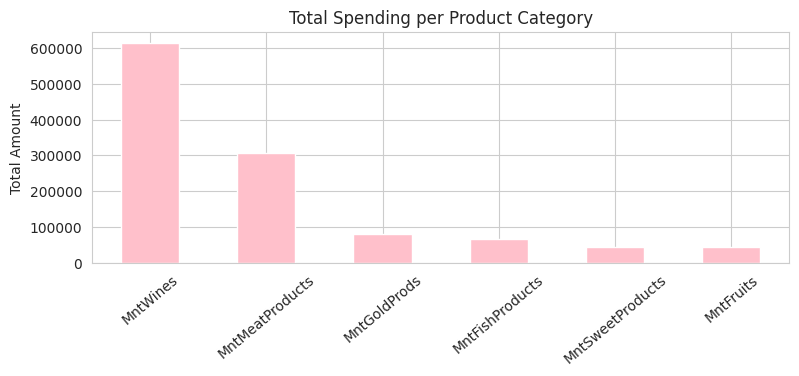

In [125]:
spend_cols = ['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']

plt.figure(figsize=(9,3))
df[spend_cols].sum().sort_values(ascending=False).plot(kind='bar', color='pink')
plt.title('Total Spending per Product Category')
plt.ylabel('Total Amount')
plt.xticks(rotation=40)
plt.show()

##**RFM Analysis**

In [126]:
# Frequency: مجموع المشتريات
df['Frequency'] = df['NumDealsPurchases'] + df['NumWebPurchases'] + \
                  df['NumCatalogPurchases'] + df['NumStorePurchases']

# Monetary: مجموع الإنفاق على كل المنتجات
df['Monetary'] = df['MntWines'] + df['MntFruits'] + df['MntMeatProducts'] + \
                 df['MntFishProducts'] + df['MntSweetProducts'] + df['MntGoldProds']

# Recency موجودة بالفعل في df['Recency']

rfm_cols = ['Recency','Frequency','Monetary']
rfm_data = df[rfm_cols].copy()

rfm_data.head()

,Recency,Frequency,Monetary
0,58,25,1552.5
1,38,6,27.0
2,26,21,776.0
3,26,8,53.0
4,94,19,422.0


In [127]:
rfm_data.isnull().sum()

,0
Recency,0
Frequency,0
Monetary,0


###Scaling RFM Metrics

In [128]:
# Scaling data قبل clustering
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_data)

print("RFM data ready for clustering! Shape:", rfm_scaled.shape)

RFM data ready for clustering! Shape: (2039, 3)


##**K-Means Clustering**

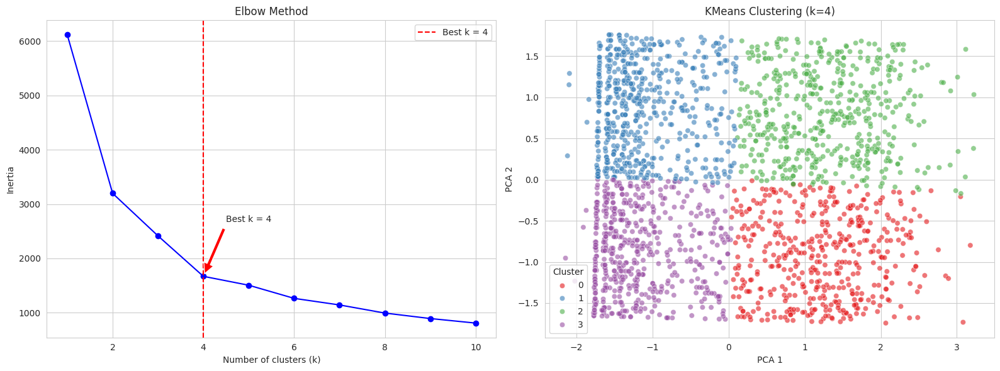

In [129]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# --- بيانات RFM جاهزة ---
rfm_cols = ['Recency','Frequency','Monetary']
rfm_data = df[rfm_cols].copy()

# --- Standardize data ---
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_data)

# --- Elbow Method ---
inertia = []
K_range = range(1,11)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(rfm_scaled)
    inertia.append(kmeans.inertia_)

best_k = 4  # اختاري العدد المناسب من الانحناء

# --- تطبيق KMeans ---
kmeans = KMeans(n_clusters=best_k, random_state=42)
df['Cluster'] = kmeans.fit_predict(rfm_scaled)

# --- تقليل الأبعاد لعرض الكلاستر ---
pca = PCA(n_components=2)
rfm_pca = pca.fit_transform(rfm_scaled)

# --- رسم Subplots ---
fig, axes = plt.subplots(1, 2, figsize=(16,6))

# 1️⃣ Elbow Method
axes[0].plot(K_range, inertia, 'bo-')
axes[0].set_xlabel('Number of clusters (k)')
axes[0].set_ylabel('Inertia')
axes[0].set_title('Elbow Method')
axes[0].axvline(x=best_k, color='red', linestyle='--', label=f'Best k = {best_k}')
axes[0].annotate(f'Best k = {best_k}', xy=(best_k, inertia[best_k-1]),
                 xytext=(best_k+0.5, inertia[best_k-1]+1000),
                 arrowprops=dict(facecolor='red', shrink=0.05))
axes[0].legend()

# 2️⃣ KMeans scatter
sns.scatterplot(x=rfm_pca[:,0], y=rfm_pca[:,1], hue=df['Cluster'],
                palette='Set1', alpha=0.6, ax=axes[1])
axes[1].set_title(f'KMeans Clustering (k={best_k})')
axes[1].set_xlabel('PCA 1')
axes[1].set_ylabel('PCA 2')

plt.tight_layout()
plt.show()

In [130]:
from sklearn.metrics import silhouette_score

score = silhouette_score(rfm_scaled, df['Cluster'])
print("Silhouette Score:", score)

Silhouette Score: 0.3805414317016792


##**hierarchical clustering**

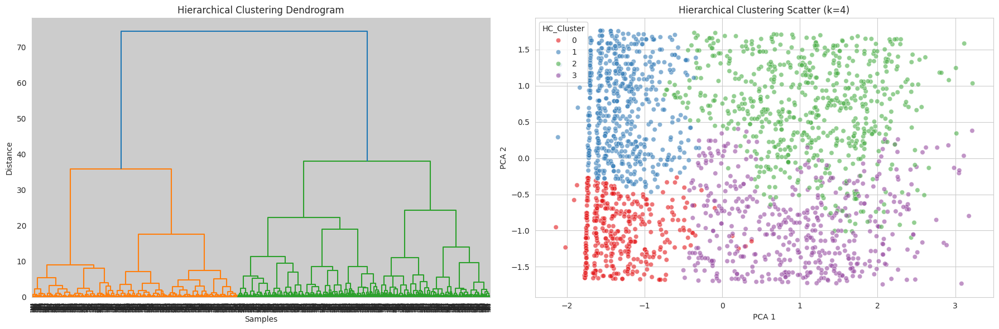

              Recency  Frequency    Monetary
HC_Cluster                                  
0           19.032345   7.479784  102.398922
1           68.456044   7.626374   89.304945
2           70.000000  20.913249  953.732650
3           23.135246  19.950820  953.889857


In [134]:
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# --- بيانات RFM جاهزة ---
rfm_cols = ['Recency','Frequency','Monetary']
rfm_data = df[rfm_cols].copy()

# --- Standardize data ---
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_data)

# --- إنشاء linkage matrix ---
linked = linkage(rfm_scaled, method='ward')

# --- اختيار عدد الكلاستر ---
k = 4
df['HC_Cluster'] = fcluster(linked, k, criterion='maxclust') - 1  # نبدأ من 0

# --- PCA لتقليل الأبعاد للعرض ---
pca = PCA(n_components=2)
rfm_pca = pca.fit_transform(rfm_scaled)

# --- رسم Subplots ---
fig, axes = plt.subplots(1, 2, figsize=(18,6))

# 1️⃣ Dendrogram
dendrogram(linked, ax=axes[0],
           orientation='top',
           distance_sort='ascending',
           show_leaf_counts=False)
axes[0].set_title('Hierarchical Clustering Dendrogram')
axes[0].set_xlabel('Samples')
axes[0].set_ylabel('Distance')

# 2️⃣ Scatter بعد PCA
sns.scatterplot(x=rfm_pca[:,0], y=rfm_pca[:,1], hue=df['HC_Cluster'],
                palette='Set1', alpha=0.6, ax=axes[1])
axes[1].set_title(f'Hierarchical Clustering Scatter (k={k})')
axes[1].set_xlabel('PCA 1')
axes[1].set_ylabel('PCA 2')

plt.tight_layout()
plt.show()

# --- عرض متوسط كل RFM لكل Cluster ---
print(df.groupby('HC_Cluster')[rfm_cols].mean())

In [132]:
from sklearn.metrics import silhouette_score

# --- بيانات RFM جاهزة ---
rfm_cols = ['Recency','Frequency','Monetary']
rfm_data = df[rfm_cols].copy()

# --- Standardize data ---
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_data)

# --- Hierarchical Clustering ---
from scipy.cluster.hierarchy import linkage, fcluster
linked = linkage(rfm_scaled, method='ward')
k = 4
hc_labels = fcluster(linked, k, criterion='maxclust') - 1  # تبدأ من 0

# --- حساب Silhouette Score ---
sil_score = silhouette_score(rfm_scaled, hc_labels)
print(f'Silhouette Score for Hierarchical Clustering (k={k}): {sil_score:.4f}')

Silhouette Score for Hierarchical Clustering (k=4): 0.3263


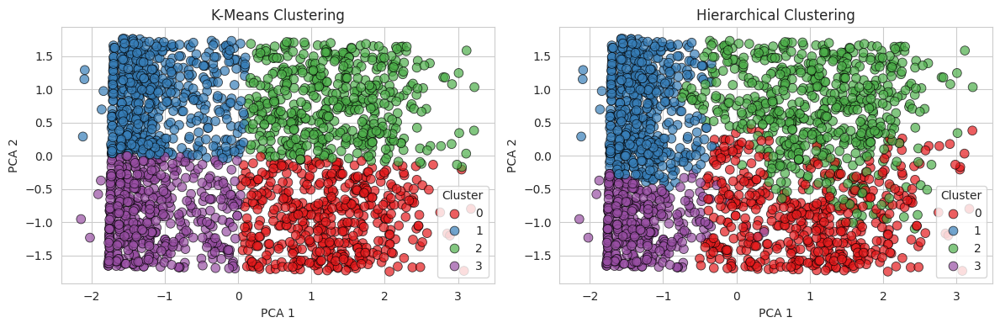

In [133]:
from sklearn.cluster import KMeans, AgglomerativeClustering
import matplotlib.pyplot as plt
import seaborn as sns

# --- تأكد أن البيانات RFM موجودة ---
X = rfm_pca  # بيانات RFM بعد PCA 2D

# --- KMeans ---
kmeans = KMeans(n_clusters=4, random_state=42, n_init='auto')
y_km = kmeans.fit_predict(rfm_scaled)

# --- Agglomerative ---
hc = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
y_hc = hc.fit_predict(rfm_scaled)

# --- رسم المقارنة ---
fig, axes = plt.subplots(1, 2, figsize=(12,4))

# 1️⃣ KMeans
sns.scatterplot(x=X[:,0], y=X[:,1], hue=y_km, palette='Set1', ax=axes[0], s=60, edgecolor='k', alpha=0.7)
axes[0].set_title('K-Means Clustering')
axes[0].set_xlabel('PCA 1')
axes[0].set_ylabel('PCA 2')
axes[0].legend(title='Cluster', loc='best')

# 2️⃣ Agglomerative
sns.scatterplot(x=X[:,0], y=X[:,1], hue=y_hc, palette='Set1', ax=axes[1], s=60, edgecolor='k', alpha=0.7)
axes[1].set_title('Hierarchical Clustering')
axes[1].set_xlabel('PCA 1')
axes[1].set_ylabel('PCA 2')
axes[1].legend(title='Cluster', loc='best')

plt.tight_layout()
plt.show()

In [148]:
# @title
from IPython.display import display, HTML

display(HTML('''
<center>
  <img src="https://camo.githubusercontent.com/ca22dfa769a7ba95a6e7d68e2e5423700c1717f3df49674898be9a383e0fec92/68747470733a2f2f6d2e6d656469612d616d617a6f6e2e636f6d2f696d616765732f472f33312f616d617a6f6e73657276696365732f426c6f672f31355f426c6f675f332d30322e6a7067"
       alt="Customer Segmentation"
       width="700">
</center>
'''))
